In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

from sklearn.decomposition import NMF

import utils.sulfur.constant as const
from utils.CaImageCSV import CaImageCSV

In [2]:
file_path = './resources/%s_Longitudinal_Traces.csv' % 'ID181106CreK'
csv = CaImageCSV(file_path)

/opt/conda/lib/python3.8/site-packages/pandas/core/indexing.py:1843: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value
/opt/conda/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [3]:
def droped_unique_cells(cells1, cells2):
    droped_cells = np.array([])
    droped_cells = np.append(droped_cells, cells1)
    droped_cells = np.append(droped_cells, cells2)
    droped_cells = np.unique(droped_cells)
    return droped_cells

def all_nan_cells(matrix):
    nan_cells = np.array([])
    for cell_name, items in matrix.iteritems():
        if items.isnull().all():
            nan_cells = np.append(nan_cells, cell_name)
            
    return nan_cells

def splitted_context_name(context_name, index):
    return '%s_%d' % (context_name, index)

def build_matrix_index(context_name, cells):
    index_df = pd.DataFrame(data=([context_name] * len(cells)))
    index_df.columns = ['context']
    cells = cells.reset_index(drop=True)
    index_df['cell_name'] = cells
    return pd.MultiIndex.from_frame(index_df, names=['context_name', 'cell_name'])

def split_matrix(matrix, context_name):
    matrix_1 = matrix.iloc[0:400, :]
    matrix_2 = matrix.iloc[900:1300, :]
    matrix_3 = matrix.iloc[1800:2200, :]
    
    matrix_1.rename(lambda x: splitted_context_name(x, 1), inplace=True)
    matrix_2.rename(lambda x: splitted_context_name(x, 2), inplace=True)
    matrix_3.rename(lambda x: splitted_context_name(x, 3), inplace=True)
    
    return matrix_1, matrix_2, matrix_3

def split_engram_matrix(origin, context_name):
    matrix = origin.filtered_by_context(context_name).astype(float).copy(deep=True)
    matrix = origin.optimize_std(matrix)
    matrix.reset_index(level=1, drop=True, inplace=True)
    
    engram_matrix = matrix.loc[:, origin.engram_cells()]
    non_engram_matrix = matrix.loc[:, csv.non_engram_cells()]
    
    return engram_matrix, non_engram_matrix

In [4]:
A1postES_engram, A1postES_non_engram = split_engram_matrix(csv, 'A1postES')
A4postES_engram, A4postES_non_engram = split_engram_matrix(csv, 'A4postES')

A1postES_nan_engram_cells = all_nan_cells(A1postES_engram)
A1postES_nan_non_engram_cells = all_nan_cells(A1postES_non_engram)
A4postES_nan_engram_cells = all_nan_cells(A4postES_engram)
A4postES_nan_non_engram_cells = all_nan_cells(A4postES_non_engram)

droped_engram_cells = droped_unique_cells(A1postES_nan_engram_cells, A4postES_nan_engram_cells)
droped_non_engram_cells = droped_unique_cells(A1postES_nan_non_engram_cells, A4postES_nan_non_engram_cells)

A1postES_engram.drop(columns=droped_engram_cells, inplace=True)
A1postES_non_engram.drop(columns=droped_non_engram_cells, inplace=True)

A4postES_engram.drop(columns=droped_engram_cells, inplace=True)
A4postES_non_engram.drop(columns=droped_non_engram_cells, inplace=True)

engram_A1postES_1, engram_A1postES_2, engram_A1postES_3 = split_matrix(A1postES_engram, 'A1postES')
engram_A4postES_1, engram_A4postES_2, engram_A4postES_3 = split_matrix(A4postES_engram, 'A4postES')

non_engram_A1postES_1, non_engram_A1postES_2, non_engram_A1postES_3 = split_matrix(A1postES_non_engram, 'A1postES')
non_engram_A4postES_1, non_engram_A4postES_2, non_engram_A4postES_3 = split_matrix(A4postES_non_engram, 'A4postES')

/opt/conda/lib/python3.8/site-packages/pandas/core/frame.py:4441: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


In [5]:
engram_A1postES_1

,C040,C073,C074,C083,C088,C095,C100,C118,C137,C149,...,C225,C256,C342,C350,C381,C390,C409,C415,C416,C446
context,,,,,,,,,,,,,,,,,,,,,
A1postES_1,4.040086,8.489794,0.854931,2.052163,1.333224,0.441511,2.586883,0.677957,1.918729,0.632620,...,1.526988,1.986505,0.744956,2.225518,0.390008,0.901748,0.434792,0.447636,2.082195,3.682389
A1postES_1,3.770868,8.454772,0.792355,1.860798,1.217343,0.411569,2.346044,0.729952,2.061889,1.270124,...,1.393437,2.333441,0.705472,2.052280,0.361195,1.006607,0.405502,0.466720,1.942627,3.480934
A1postES_1,3.714006,7.739068,0.734358,1.687208,1.111533,0.383532,2.127606,0.674406,1.900746,1.147293,...,1.271567,2.581787,0.693560,1.892526,0.334500,0.954609,0.378180,0.437591,1.812413,3.933316
A1postES_1,4.005992,7.083948,0.680607,2.903852,1.014921,0.357281,2.637709,0.623081,1.971603,1.421783,...,1.160356,2.617860,0.656784,1.745208,0.309768,1.260039,0.678815,0.410279,1.690930,3.758737
A1postES_1,4.400954,6.484282,1.299106,2.633376,0.926706,0.332701,2.392141,0.790254,1.980646,1.463170,...,1.058871,2.427082,0.693415,1.609358,0.286854,1.167842,0.633126,0.384671,1.577587,3.566809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A1postES_1,1.824284,1.096992,0.143911,1.437227,1.595480,0.449548,2.444451,0.632608,2.549032,1.455638,...,1.050617,1.183470,0.019017,1.825969,0.062714,2.661662,0.115474,0.075547,0.952845,0.356980
A1postES_1,2.540197,1.004130,0.133375,1.785653,1.519068,0.505717,2.216860,0.584459,2.462182,1.314866,...,0.958730,1.097224,0.017769,1.683832,0.057965,3.147777,0.107643,0.070813,0.888976,0.335687
A1postES_1,2.370925,0.919129,0.123610,1.852217,1.522576,0.471687,2.874507,0.539971,2.551740,1.187707,...,0.874880,1.017263,0.016587,1.552760,0.053565,3.742973,0.100339,0.066374,0.829389,0.397803


In [6]:
models = []
x = list(range(15, 24))
for n in x:
    model = NMF(n_components=n, init='random', random_state=0)
    model.fit(engram_A1postES_1)
    models.append(model)

/opt/conda/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"
/opt/conda/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"
/opt/conda/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"
/opt/conda/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"
/opt/conda/l

In [7]:
models

[NMF(init='random', n_components=15, random_state=0),
 NMF(init='random', n_components=16, random_state=0),
 NMF(init='random', n_components=17, random_state=0),
 NMF(init='random', n_components=18, random_state=0),
 NMF(init='random', n_components=19, random_state=0),
 NMF(init='random', n_components=20, random_state=0),
 NMF(init='random', n_components=21, random_state=0),
 NMF(init='random', n_components=22, random_state=0),
 NMF(init='random', n_components=23, random_state=0)]

[1117.1451400303076, 936.5549141106083, 769.6549401668913, 499.2514476061724, 509.4034336583112, 219.39858531635937, 159.52997165949452, 100.973573051683, 111.50234338341002]


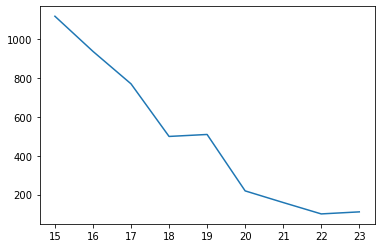

In [8]:
errors = []
for model in models:
    H = model.components_
    W = model.transform(engram_A1postES_1)
    X=np.dot(W, H)
    errors.append(abs(engram_A1postES_1 - X).sum().sum())
    
print(errors)
    
plt.plot(x, errors)
plt.show()

In [9]:
import math

def AICc(distance, K, N):
    return 2 * distance + 2 * K * (N / (N - K - 1)) # 対数尤度=-Dis(x,y) より 

def setted_NMF(df, components_size):
    model = NMF(n_components=components_size, init='random', random_state=0, beta_loss='kullback-leibler', solver='mu', max_iter=2000)
    model.fit(df)
    W = model.transform(df)
    H = model.components_
    
    return W, H, model
    
def build_pattern_vectors(dfs):
    patterns = {}
    for context_name, df in dfs.items():
        min_aic_value = float('inf')
        min_H = None
        upper_count = 0
        
        for n in range(1, len(df.columns) + 1):
            _, H, model = setted_NMF(df, n)
            err = model.reconstruction_err_
            aic_value = AICc(err, n, len(columns) * len(df))
            if min_aic_value > aic_value:
                upper_count = 0
                min_aic_value = aic_value
                min_H = H
                
            if min_aic_value < aic_value:
                upper_count += 1
                
            if upper_count > 20:
                break
                
        patterns[context_name] = min_H
        
    return patterns

In [10]:
# %%time

index = ['A1postES_1', 'A1postES_2', 'A1postES_3', 'A4postES_1', 'A4postES_2', 'A4postES_3']
columns = x = list(range(1, 24))
error_df = pd.DataFrame(0.0, index=index, columns=columns)
engram_df = {}
engram_df['A1postES_1'] = engram_A1postES_1
engram_df['A1postES_2'] = engram_A1postES_2
engram_df['A1postES_3'] = engram_A1postES_3
engram_df['A4postES_1'] = engram_A4postES_1
engram_df['A4postES_2'] = engram_A4postES_2
engram_df['A4postES_3'] = engram_A4postES_3
for key, df in engram_df.items():
    for n in columns:
        _, _, model = setted_NMF(df, n)
        err = model.reconstruction_err_
        aic_value = AICc(err, n, len(columns) * 400)
        error_df.loc[key, n] = aic_value
        
error_df

,1,2,3,4,5,6,7,8,9,10,...,14,15,16,17,18,19,20,21,22,23
A1postES_1,182.851589,153.921684,135.661389,113.190495,106.738071,101.755010,97.745803,95.653074,88.005889,86.259066,...,74.714232,74.614382,73.411139,68.704702,67.642879,62.394913,63.989179,60.100688,61.759761,62.521547
A1postES_2,160.355683,144.392778,129.480687,118.391048,108.391948,104.754028,93.317783,88.392487,83.208536,78.847914,...,68.394335,68.225049,65.107348,63.289473,61.906544,59.109447,59.456095,56.875609,61.117659,59.494346
A1postES_3,135.187289,112.037350,98.556405,90.730216,84.383641,81.446047,77.842585,75.901119,71.371158,69.778719,...,63.540800,64.152325,63.465477,61.298857,60.292919,60.969009,57.208891,57.431726,57.969272,55.636512
A4postES_1,160.027774,145.751079,135.680036,119.055369,107.808429,103.948240,98.005077,93.287228,88.603225,87.623897,...,74.223090,73.623224,72.361559,68.850287,67.726192,63.813868,64.083969,61.278803,57.937768,59.479177
A4postES_2,161.986338,142.541145,128.855266,118.772111,110.670975,104.556607,98.896330,91.876098,88.563437,84.714971,...,76.644635,74.682529,71.071581,69.998573,68.234268,65.699953,62.280598,61.414392,59.044352,58.771374
A4postES_3,135.331068,116.609883,101.959516,95.371588,90.010503,84.737246,81.723945,77.883833,73.817287,73.313173,...,68.645908,69.006950,70.415320,64.931837,63.685851,66.986426,64.285632,63.136697,60.773992,60.497515


21


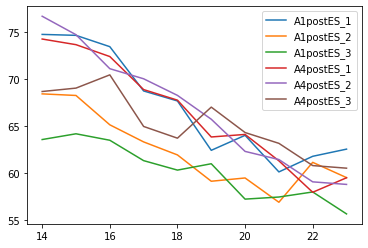

In [11]:
min_index = 1000
for session_name, rows in error_df.iloc[:, 13:].iterrows():
    row_min_index = rows.idxmin()
    if row_min_index < min_index:
        min_index = row_min_index
    plt.plot(list(range(14, 24)), rows, label=session_name)
print(min_index)
plt.legend()
plt.show()

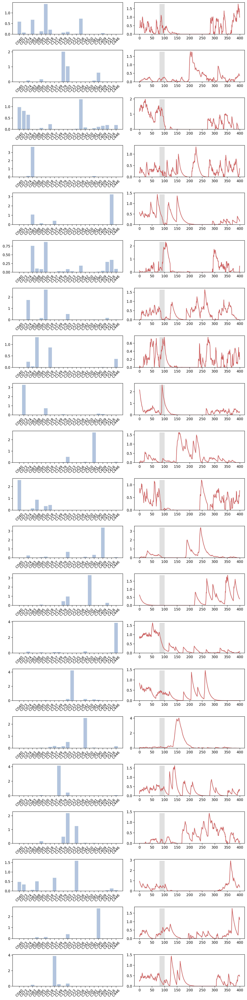

In [12]:
W, H, nmf = setted_NMF(engram_A1postES_1, min_index)

fig, axes = plt.subplots(nrows=len(H), ncols=2, figsize=(10, 40), dpi=200)
for i, mags in enumerate(H):
    ax = axes[i][0]
    for j, mag in enumerate(mags):
        ax.bar(x=j, height=mag, color='lightsteelblue')
        ax.set_xticks(list(range(len(engram_A1postES_1.columns))))
        labels = [cell_name for cell_name in engram_A1postES_1.columns]
        ax.set_xticklabels(labels=labels, rotation=45)
        #ax.set_ylim(0, 5)
        
for i, intensities in enumerate(W.T):
    ax = axes[i][1]
    ax.plot(intensities, color='indianred')
    ax.bar(x=80, height=intensities.max(), width=20, color='silver', alpha=0.5, align='edge')

plt.tight_layout()
plt.show()

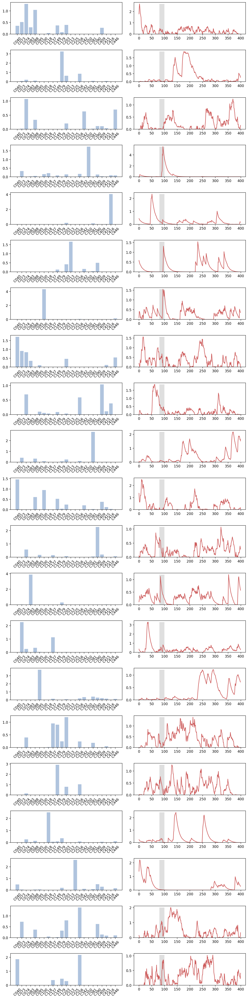

In [13]:
W, H, nmf = setted_NMF(engram_A1postES_2, min_index)

fig, axes = plt.subplots(nrows=len(H), ncols=2, figsize=(10, 40), dpi=200)
for i, mags in enumerate(H):
    ax = axes[i][0]
    for j, mag in enumerate(mags):
        ax.bar(x=j, height=mag, color='lightsteelblue')
        ax.set_xticks(list(range(len(engram_A1postES_2.columns))))
        labels = [cell_name for cell_name in engram_A1postES_2.columns]
        ax.set_xticklabels(labels=labels, rotation=45)
        #ax.set_ylim(0, 5)
        
for i, intensities in enumerate(W.T):
    ax = axes[i][1]
    ax.plot(intensities, color='indianred')
    ax.bar(x=80, height=intensities.max(), width=20, color='silver', alpha=0.5, align='edge')

plt.tight_layout()
plt.show()

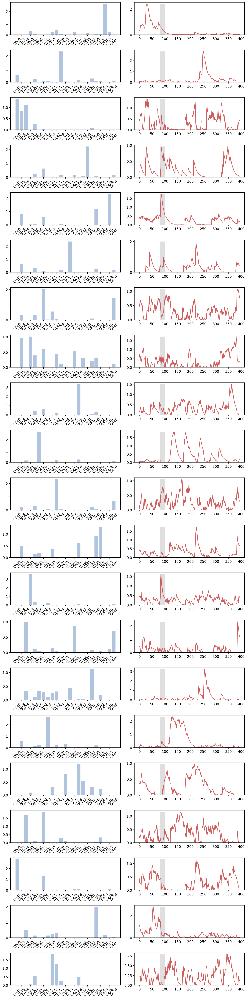

In [14]:
W, H, nmf = setted_NMF(engram_A1postES_3, min_index)

fig, axes = plt.subplots(nrows=len(H), ncols=2, figsize=(10, 40), dpi=200)
for i, mags in enumerate(H):
    ax = axes[i][0]
    for j, mag in enumerate(mags):
        ax.bar(x=j, height=mag, color='lightsteelblue')
        ax.set_xticks(list(range(len(engram_A1postES_1.columns))))
        labels = [cell_name for cell_name in engram_A1postES_1.columns]
        ax.set_xticklabels(labels=labels, rotation=45)
        #ax.set_ylim(0, 5)
        
for i, intensities in enumerate(W.T):
    ax = axes[i][1]
    ax.plot(intensities, color='indianred')
    ax.bar(x=80, height=intensities.max(), width=20, color='silver', alpha=0.5, align='edge')

plt.tight_layout()
plt.show()

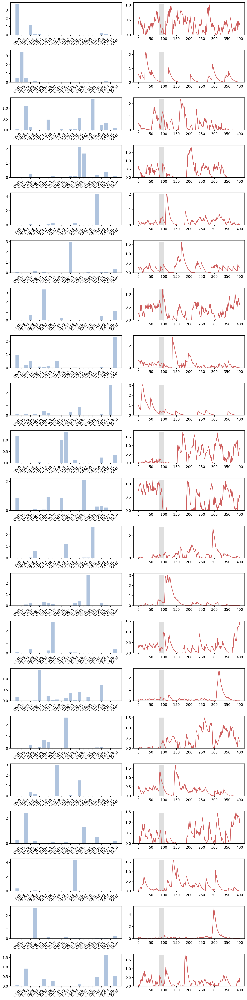

In [15]:
W, H, nmf = setted_NMF(engram_A4postES_1, min_index)

fig, axes = plt.subplots(nrows=len(H), ncols=2, figsize=(10, 40), dpi=200)
for i, mags in enumerate(H):
    ax = axes[i][0]
    for j, mag in enumerate(mags):
        ax.bar(x=j, height=mag, color='lightsteelblue')
        ax.set_xticks(list(range(len(engram_A1postES_1.columns))))
        labels = [cell_name for cell_name in engram_A1postES_1.columns]
        ax.set_xticklabels(labels=labels, rotation=45)
        #ax.set_ylim(0, 5)
        
for i, intensities in enumerate(W.T):
    ax = axes[i][1]
    ax.plot(intensities, color='indianred')
    ax.bar(x=80, height=intensities.max(), width=20, color='silver', alpha=0.5, align='edge')

plt.tight_layout()
plt.show()

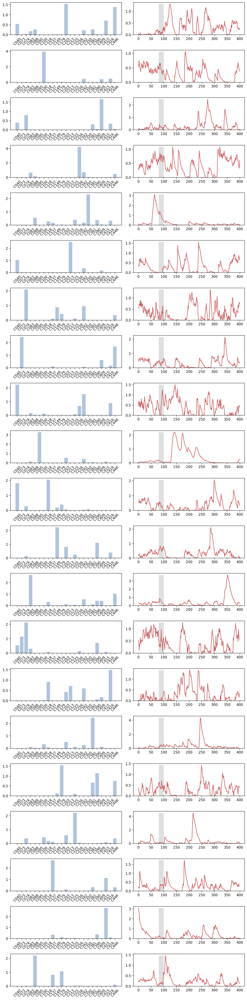

In [16]:
W, H, nmf = setted_NMF(engram_A4postES_2, min_index)

fig, axes = plt.subplots(nrows=len(H), ncols=2, figsize=(10, 40), dpi=200)
for i, mags in enumerate(H):
    ax = axes[i][0]
    for j, mag in enumerate(mags):
        ax.bar(x=j, height=mag, color='lightsteelblue')
        ax.set_xticks(list(range(len(engram_A1postES_1.columns))))
        labels = [cell_name for cell_name in engram_A1postES_1.columns]
        ax.set_xticklabels(labels=labels, rotation=45)
        #ax.set_ylim(0, 5)
        
for i, intensities in enumerate(W.T):
    ax = axes[i][1]
    ax.plot(intensities, color='indianred')
    ax.bar(x=80, height=intensities.max(), width=20, color='silver', alpha=0.5, align='edge')

plt.tight_layout()
plt.show()

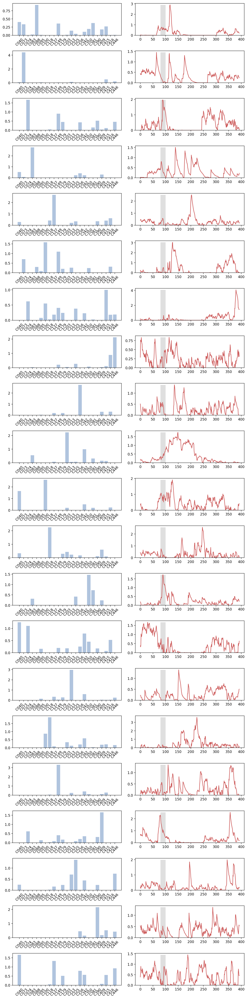

In [17]:
W, H, nmf = setted_NMF(engram_A4postES_3, min_index)

fig, axes = plt.subplots(nrows=len(H), ncols=2, figsize=(10, 40), dpi=200)
for i, mags in enumerate(H):
    ax = axes[i][0]
    for j, mag in enumerate(mags):
        ax.bar(x=j, height=mag, color='lightsteelblue')
        ax.set_xticks(list(range(len(engram_A1postES_1.columns))))
        labels = [cell_name for cell_name in engram_A1postES_1.columns]
        ax.set_xticklabels(labels=labels, rotation=45)
        #ax.set_ylim(0, 5)
        
for i, intensities in enumerate(W.T):
    ax = axes[i][1]
    ax.plot(intensities, color='indianred')
    ax.bar(x=80, height=intensities.max(), width=20, color='silver', alpha=0.5, align='edge')

plt.tight_layout()
plt.show()

In [18]:
engram_df = {}
engram_df['A1_1'] = engram_A1postES_1
engram_df['A1_2'] = engram_A1postES_2
engram_df['A1_3'] = engram_A1postES_3
engram_df['A4_1'] = engram_A4postES_1
engram_df['A4_2'] = engram_A4postES_2
engram_df['A4_3'] = engram_A4postES_3

engram_patterns = build_pattern_vectors(engram_df)
engram_patterns

{'A1_1': array([[5.87813590e-01, 7.31483146e-02, 0.00000000e+00, 6.74107905e-01,
         8.82489259e-03, 1.32172348e-01, 1.41711686e+00, 2.08304823e-01,
         0.00000000e+00, 1.14035916e-07, 7.42937931e-02, 1.08776075e-01,
         0.00000000e+00, 1.79632265e-02, 7.26061713e-01, 0.00000000e+00,
         4.20126733e-04, 3.49096244e-08, 2.74362826e-05, 4.91490240e-02,
         0.00000000e+00, 1.22541383e-04, 1.52467122e-13],
        [1.09597610e-15, 0.00000000e+00, 8.92784431e-02, 0.00000000e+00,
         0.00000000e+00, 1.64418002e-01, 9.60998446e-03, 0.00000000e+00,
         0.00000000e+00, 1.79569492e-05, 2.01708176e+00, 1.03294436e+00,
         3.73031493e-10, 4.93109979e-07, 0.00000000e+00, 8.45119677e-07,
         0.00000000e+00, 8.01182299e-02, 6.11085313e-01, 1.50298329e-02,
         1.06673546e-02, 2.48333906e-03, 1.76706009e-08],
        [9.79885507e-01, 8.12615750e-01, 6.45270037e-01, 4.22688948e-04,
         7.95681851e-09, 6.18721614e-02, 4.05431485e-04, 2.26875559e-01,


In [19]:
cdict = {
    "red": [
        (0.0, 0.0, 1.0),
        #(0.25, 0.2, 0.4),
        (0.5, 0.3, 1.0),
        (0.75, 1.0, 1.0),
        (1.0, 1.0, 1.0),
    ],
    "green": [
        (0.0, 0.0, 1.0),
        #(0.25, 0.2, 0.5),
        (0.5, 0.3, 1.0),
        (0.75, 0.0, 0.0),
        (1.0, 0.3, 0.6),
    ],
    "blue": [
        (0.0, 0.0, 1.0),
        #(0.25, 1.0, 0.9),
        (0.5, 1.0, 0.0),
        (0.75, 0.0, 0.0),
        (1.0, 0.0, 0.0),
    ],
}

cmap = LinearSegmentedColormap("custom", cdict)

In [20]:
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

fig, axes = plt.subplots(ncols=len(engram_patterns), nrows=len(engram_patterns), figsize=(30, 30), dpi=300)
for i, base_session in enumerate(engram_patterns.keys()):
    for j, compared_session in enumerate(engram_patterns.keys()):
        if j <= i:
            axes[i][j].set_visible(False)
            continue
            
        cos_similarity = cosine_similarity(engram_patterns[base_session], engram_patterns[compared_session])
        
        heatmap = sns.heatmap(cos_similarity, ax=axes[i][j], vmin=0.0, vmax=1.0, square=True, center=0.6, cmap=cmap, cbar=True)
        heatmap.invert_yaxis()
        heatmap.set_xlabel(base_session, fontsize=20)
        heatmap.set_ylabel(compared_session, fontsize=20)
        
plt.tight_layout()
plt.show()

# A1_1 v.s A1_2
#a1_1_vs_a1_2 = cosine_similarity(engram_patterns['A1_1'], engram_patterns['A1_2'])
#b = sns.heatmap(a1_1_vs_a1_2, vmin=0.0, vmax=1.0, square=True, cmap='bwr')
#b.invert_yaxis()
#plt.show()
#
## A1_1 v.s A4_1
#a1_1_vs_a4_1 = cosine_similarity(engram_patterns['A1_1'], engram_patterns['A4_1'])
#heatmap = sns.heatmap(a1_1_vs_a4_1, vmin=0.0, vmax=1.0, square=True, cmap='bwr')
#heatmap.invert_yaxis()
#plt.show()

In [21]:
len(non_engram_A1postES_1.columns)

267

1      539.658665
5      381.747677
9      319.275745
13     282.682942
17     259.057825
          ...    
249    541.395542
253    549.104578
257    556.097160
261    563.597846
265    571.461898
Length: 67, dtype: float64


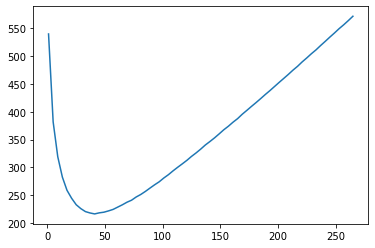

In [22]:
index = ['A1postES_1', 'A1postES_2', 'A1postES_3', 'A4postES_1', 'A4postES_2', 'A4postES_3']
columns = x = list(range(1, 268, 4))
non_engram_error_df = pd.DataFrame(0.0, index=index, columns=columns)
non_engram_df = {}
non_engram_df['A1postES_1'] = non_engram_A1postES_1
non_engram_df['A1postES_2'] = non_engram_A1postES_2
non_engram_df['A1postES_3'] = non_engram_A1postES_3
non_engram_df['A4postES_1'] = non_engram_A4postES_1
non_engram_df['A4postES_2'] = non_engram_A4postES_2
non_engram_df['A4postES_3'] = non_engram_A4postES_3
for key, df in non_engram_df.items():
    for n in columns:
        _, _, model = setted_NMF(df, n)
        err = model.reconstruction_err_
        aic_value = AICc(err, n, len(columns) * 400)
        non_engram_error_df.loc[key, n] = aic_value
        
print(non_engram_error_df.mean())

plt.plot(columns, non_engram_error_df.mean())
plt.show()

In [23]:
non_engram_error_df.mean().idxmin()

41

In [24]:
non_engram_df = {}
non_engram_df['A1_1'] = non_engram_A1postES_1
non_engram_df['A1_2'] = non_engram_A1postES_2
non_engram_df['A1_3'] = non_engram_A1postES_3
non_engram_df['A4_1'] = non_engram_A4postES_1
non_engram_df['A4_2'] = non_engram_A4postES_2
non_engram_df['A4_3'] = non_engram_A4postES_3

non_engram_patterns = build_pattern_vectors(non_engram_df)
        
fig, axes = plt.subplots(ncols=len(non_engram_patterns), nrows=len(non_engram_patterns), figsize=(30, 30), dpi=300)
for i, base_session in enumerate(non_engram_patterns.keys()):
    for j, compared_session in enumerate(non_engram_patterns.keys()):
        if j <= i:
            axes[i][j].set_visible(False)
            continue
            
        cos_similarity = cosine_similarity(non_engram_patterns[base_session], non_engram_patterns[compared_session])
        
        heatmap = sns.heatmap(cos_similarity, ax=axes[i][j], vmin=0.0, vmax=1.0, square=True, center=0.6, cmap=cmap, cbar=True)
        heatmap.invert_yaxis()
        heatmap.set_xlabel(base_session, fontsize=20)
        heatmap.set_ylabel(compared_session, fontsize=20)
        
plt.tight_layout()
plt.show()

In [25]:
type(sns.color_palette(n_colors=3))

seaborn.palettes._ColorPalette